# Implementing Naive Bayes from Scratch for IMDB Fake or Real Review Classification

## Introduction
Bayes Theorem is named after the English mathematician Thomas Bayes, who made significant contributions to decision theory, a field of mathematics that involves probabilities. Bayes Theorem is widely used in machine learning as a simple and effective way to predict classes with precision and accuracy. The Bayesian method of calculating conditional probabilities is particularly useful in classification tasks.

This project focuses on implementing the Naive Bayes classification algorithm from scratch to classify IMDB reviews as fake or real. Specifically, we will implement the Multinomial Naive Bayes classifier, which is well-suited for text classification tasks where the features are word frequencies or counts.

## Naive Bayes Theorem

### Bayes Theorem Theory
Bayes Theorem is expressed as:

$$
P(A|B) = \frac{P(B|A) \cdot P(A)}{P(B)}
$$

Where:
- \( P(A|B) \) is the posterior probability: the probability of hypothesis \( A \) given the data \( B \).
- \( P(B|A) \) is the likelihood: the probability of data \( B \) given that hypothesis \( A \) is true.
- \( P(A) \) is the prior probability: the initial probability of hypothesis \( A \).
- \( P(B) \) is the marginal probability: the total probability of data \( B \).

### Naive Bayes Classification
The Naive Bayes classifier simplifies Bayes Theorem by assuming that the features are independent given the class label. The formula for Naive Bayes is:

$$
P(C|x_1, x_2, \ldots, x_n) \propto P(C) \prod_{i=1}^n P(x_i|C)
$$

Where:
- \( P(C|x_1, x_2, \ldots, x_n) \) is the probability of class \( C \) given the features \( x_1, x_2, \ldots, x_n \).
- \( P(C) \) is the prior probability of class \( C \).
- \( P(x_i|C) \) is the likelihood of feature \( x_i \) given class \( C \).



In [1]:
import pandas as pd
import numpy as np
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_colwidth', 500)
import matplotlib.pyplot as plt

import re
from sklearn.base import BaseEstimator, TransformerMixin
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from tqdm.auto import tqdm
import contractions
import random

# libraries for model

import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import precision_score

from collections import Counter

# ignore warning 
import warnings
ignore = warnings

c:\Users\AHMED OSAMA\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# import the data 

raw=pd.read_csv("IMDB Dataset.csv")

In [3]:
raw.head()

,review,sentiment
0,"One of the other reviewers has mentioned that after watching just 1 Oz episode you'll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me about Oz was its brutality and unflinching scenes of violence, which set in right from the word GO. Trust me, this is not a show for the faint hearted or timid. This show pulls no punches with regards to drugs, sex or violence. Its is hardcore, in the classic use of the word.<br /><br />It is calle...",positive
1,"A wonderful little production. <br /><br />The filming technique is very unassuming- very old-time-BBC fashion and gives a comforting, and sometimes discomforting, sense of realism to the entire piece. <br /><br />The actors are extremely well chosen- Michael Sheen not only ""has got all the polari"" but he has all the voices down pat too! You can truly see the seamless editing guided by the references to Williams' diary entries, not only is it well worth the watching but it is a terrificly wr...",positive
2,"I thought this was a wonderful way to spend time on a too hot summer weekend, sitting in the air conditioned theater and watching a light-hearted comedy. The plot is simplistic, but the dialogue is witty and the characters are likable (even the well bread suspected serial killer). While some may be disappointed when they realize this is not Match Point 2: Risk Addiction, I thought it was proof that Woody Allen is still fully in control of the style many of us have grown to love.<br /><br />T...",positive
3,"Basically there's a family where a little boy (Jake) thinks there's a zombie in his closet & his parents are fighting all the time.<br /><br />This movie is slower than a soap opera... and suddenly, Jake decides to become Rambo and kill the zombie.<br /><br />OK, first of all when you're going to make a film you must Decide if its a thriller or a drama! As a drama the movie is watchable. Parents are divorcing & arguing like in real life. And then we have Jake with his closet which totally ru...",negative
4,"Petter Mattei's ""Love in the Time of Money"" is a visually stunning film to watch. Mr. Mattei offers us a vivid portrait about human relations. This is a movie that seems to be telling us what money, power and success do to people in the different situations we encounter. <br /><br />This being a variation on the Arthur Schnitzler's play about the same theme, the director transfers the action to the present time New York where all these different characters meet and connect. Each one is conne...",positive


In [4]:
# text preprocing


# lemmatizer = WordNetLemmatizer()


def remove_urls_links(x):
    url_pattern = r'https?://\S+|www\.\S+'
    return x.apply(lambda x: re.sub(url_pattern, '', x))

def lower_char( x):
    return x.str.lower()    

def remove_contractoin( x):
    return x.apply(lambda x: contractions.fix(x))

def remove_no_word_char( x):
    pattern = r'[^a-z_\s]'
    return x.apply(lambda x: re.sub(pattern, '', x))

# def lemmatization_word( x):
    # return x.apply(lambda x: " ".join([lemmatizer.lemmatize(word, pos="n") for word in x.split()]))

def remove_stopwords( x):
    ss=stopwords.words('english')
    ss.pop(118) # exclude "not" form the stop words
    stop_words = set(ss)
    return x.apply(lambda x: " ".join([word for word in x.split() if word not in stop_words]))

def remove_new_line( x):
    return x.apply(lambda x: re.sub(r'[\n\r]+|<br />', ' ', x))

def remove_one_char(x):
    return x.apply(lambda x: ' '.join([w for w in x.split() if len(w)>1]))

In [5]:
# take a copy

df=raw.copy()

df=df.rename(columns={'sentiment':'label'})
# change the label from negative and positive to  and 1
df['label']=df['label'].map({'positive':1,'negative':0})

# apply the cleaning functions
df["review"]=remove_new_line(df["review"])
df["review"]=lower_char(df["review"])
df["review"]=remove_contractoin(df["review"])
df["review"]=remove_no_word_char(df["review"])
df["review"]=remove_stopwords(df["review"])
df["review"]=remove_one_char(df["review"])


In [6]:
# data after cleaning 
df

,review,label
0,one reviewers mentioned watching oz episode hooked right exactly happened first thing struck oz brutality unflinching scenes violence set right word go trust not show faint hearted timid show pulls punches regards drugs sex violence hardcore classic use word called oz nickname given oswald maximum security state penitentary focuses mainly emerald city experimental section prison cells glass fronts face inwards privacy not high agenda city home manyaryans muslims gangstas latinos christians i...,1
1,wonderful little production filming technique unassuming oldtimebbc fashion gives comforting sometimes discomforting sense realism entire piece actors extremely well chosen michael sheen not got polari voices pat truly see seamless editing guided references williams diary entries not well worth watching terrificly written performed piece masterful production one great masters comedy life realism really comes home little things fantasy guard rather use traditional dream techniques remains sol...,1
2,thought wonderful way spend time hot summer weekend sitting air conditioned theater watching lighthearted comedy plot simplistic dialogue witty characters likable even well bread suspected serial killer may disappointed realize not match point risk addiction thought proof woody allen still fully control style many us grown love would laughed one woodys comedies years dare say decade never impressed scarlet johanson managed tone sexy image jumped right average spirited young woman may not cro...,1
3,basically family little boy jake thinks zombie closet parents fighting time movie slower soap opera suddenly jake decides become rambo kill zombie ok first going make film must decide thriller drama drama movie watchable parents divorcing arguing like real life jake closet totally ruins film expected see boogeyman similar movie instead watched drama meaningless thriller spots well playing parents descent dialogs shots jake ignore,0
4,petter matteis love time money visually stunning film watch mr mattei offers us vivid portrait human relations movie seems telling us money power success people different situations encounter variation arthur schnitzlers play theme director transfers action present time new york different characters meet connect one connected one way another next person one seems know previous point contact stylishly film sophisticated luxurious look taken see people live world live habitat thing one gets so...,1
...,...,...
49995,thought movie right good job not creative original first expecting whole lotta fun think like comes dvd going pay money proudly every last cent sharon stone great always even movie horriblecatwoman movie not one movies underrated lifetime probably become classic like yrs not wait classic watch enjoy not expect masterpiece something gripping soul touching allow get life get involved movie entertaining recommend people not seen see critics box office say not always count see never know might e...,1
49996,bad plot bad dialogue bad acting idiotic directing annoying porn groove soundtrack ran continually overacted script crappy copy vhs cannot redeemed consuming liquor trust stuck turkey end pathetically bad figure fourthrate spoof springtime hitler girl played janis joplin faint spark interest could sing better original want watch something similar thousand times better watch beyond valley dolls,0
49997,catholic taught parochial elementary schools nuns taught jesuit priests high school college still practicing catholic would not considered good catholic churchs eyes not believe certain things act certain ways church tells back movieits bad two people killed nun supposed satire embodiment female religious figurehead comedy satire not done well acting diane keaton never saw play different movies may good first thought gun might fake first shooting plan female lead four former students attempt...,0
49998,going disagree previous comment side maltin one second rate excessively vicious western creak

In [7]:
# some data statistics
# keep= False means to keep all the actual duplicates

df[df.duplicated(keep=False)].sort_values(by='review')



,review,label
21846,absolutely atrocious adaptation wonderful childrens book crude inappropriate humor scary parts sickening side story moms boyfriend wanting send boy away military school get way makes totally inappropriate kids likely want see book yr olds not waste money time good judgement,0
29384,absolutely atrocious adaptation wonderful childrens book crude inappropriate humor scary parts sickening side story moms boyfriend wanting send boy away military school get way makes totally inappropriate kids likely want see book yr olds not waste money time good judgement,0
10976,absolutely hate programme kind people sit watch garbage ok dad mum love lol make sure well room comes depressing dreary worst thing acting cannot stand detective programmes detectives wooden heartless happened detective programmes real mystery mean wants know happened fictional characters know nothing died years ago wish bbc would put comedy bbc cos vicar dibley finished room crap like,0
49361,absolutely hate programme kind people sit watch garbage ok dad mum love lol make sure well room comes depressing dreary worst thing acting cannot stand detective programmes detectives wooden heartless happened detective programmes real mystery mean wants know happened fictional characters know nothing died years ago wish bbc would put comedy bbc cos vicar dibley finished room crap like,0
35613,accustomed patient films generally found usually pays works take tedium new levels enter realm provocationlast year marienbad comes mind well pola not last year marienbad count one hand number films walked years pola achieved membership august group defense believe made valiant effort stand ground hoping things would turn around however finally threw towel shy minute mark quite respectable circumstances pola not come anywhere near living promise caraxs earlier work year hiatus must bitter in...,0
...,...,...
9309,yes movie treated multiple little snowmen attack apparently warm climate yes movie definitely not taken seriously fact much worse movie original least one whole production looked like cost couple bucks video camera make funny moments really playing cheapness movie making intended laughs kind weak film making ask not come good story effects going really bad hey let us make movie look bad possible horrible one liners movie first one least somewhat credible story snowman one attacked winter not...,0
28750,yes not pintilie likes undress actors show publicly privies pintilie naked emperor speak big time someone state truth impostor voyeur brat locked old mans body abundance nude scenes artistic legitimacy whatsoever visual perversion gets kicks making actors strip buff look willies front audience might eve get hardon know set niki ardelean used embarrass poor coca bloss telling oh coca want great lady decent sensitive became unspeakably ashamed petty satisfaction worrying alarm signal degree vu...,0
20158,yes not pintilie likes undress actors show publicly privies pintilie naked emperor speak big time someone state truth impostor voyeur brat locked old mans body abundance nude scenes artistic legitimacy whatsoever visual perversion gets kicks making actors strip buff look willies front audience might eve get hardon know set niki ardelean used embarrass poor coca bloss telling oh coca want great lady decent sensitive became unspeakably ashamed petty satisfaction worrying alarm signal degree vu...,0
13610,yet another pseudointellectual let us make nazis look real bad movie nazis pretty bad doubt already know however not necessarily make every movie theme good discovery channel presentation wannsee conference would much interesting conspiracy falls ass two categories documentary drama not cut documentary movie staged presentation common not cut drama characters shallow conflicts easily solved another thing tagline one greatest crimes humanity perpetrated hour movie shows wannsee conference mee...,0


In [8]:
# drop the duplicates

df.drop_duplicates(inplace=True)

In [9]:
# count the word in each row 

count_word = pd.DataFrame(df['review'].apply(lambda x: len(x.split())))
count_word

,review
0,167
1,86
2,86
3,64
4,126
...,...
49995,81
49996,56
49997,116
49998,113


In [10]:
count_word[count_word['review']==count_word['review'].max()]

,review
31481,1412


In [11]:
print("the maximum word in the review is",count_word['review'].max(),"happend ",count_word[count_word['review']==count_word['review'].max()].shape[0], "times" )
print("the maximum word in the review is",count_word['review'].min(),"happend ",count_word[count_word['review']==count_word['review'].min()].shape[0], "times" )


the maximum word in the review is 1412 happend  1 times
the maximum word in the review is 3 happend  1 times


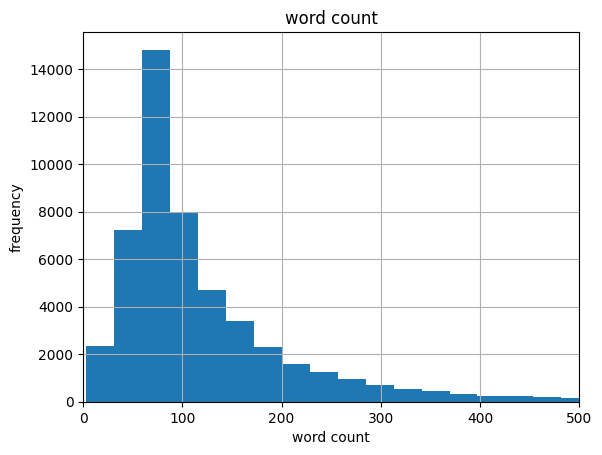

In [12]:
# histogram to show the frequncy of the words 

count_word['review'].hist(bins=50)
plt.xlim([0, 500])
plt.title('word count')
plt.xlabel('word count')
plt.ylabel('frequency')
plt.show()

In [13]:
# count the row where the words are greater than 200

print("the number of rows where the words are greater than 200 is",count_word[count_word['review']>200].shape[0])

the number of rows where the words are greater than 200 is 6879


In [14]:
# some insights

df.label.value_counts()


label
1    24881
0    24695
Name: count, dtype: int64

In [15]:
# split the data test and train 


X_train, X_test, y_train, y_test = train_test_split(df['review'], df['label'], test_size=0.2, random_state=42)
# reconstruct the test and train data frames

train_df=pd.concat([X_train,y_train],axis=1)
test_df=pd.concat([X_test,y_test],axis=1)   

In [16]:
# for the traing data drop any raw with words more than 200 

train_df=train_df[train_df['review'].apply(lambda x: len(x.split())<=200)]
train_df    

,review,label
32991,pretty good movie love fighter jet movies best one seen lately made using real planes made even better movie like watching yous fs blow living daylights enemies great movie,1
8167,time get psycho toy maker named joe petto get makes living evil toys kill people goes family bad luck simply living house mutant robot son pino get used live easily worst hopefully presumably last semi series one previous one look like soft core porn movies without sex nudity kind like low rent hybrid halloween iii puppet master dolls bad home movies supposedly started sixth chapter series abandoned never completed hope stays way star,0
18848,screenplay bad action sequences really liked think image good better romanian movies liked also actors jobs,0
26826,ok maybe north east scotland talk like guys film found great fun cheap fun sure plenty effort gone making film look great actors certainly give actually quite effected died particulare captain finally fell script well game halfs opening half film well written sharp last half hour not great many questions left unanswered doubtless annoy others annoyed nevertheless good fun smart first feature sturton,1
46032,movie answers question relationship survive girlfriend codependent clinging needy jealous powers abilities far beyond mortal women without spoiling movie safely assure not great fun along way uma thurman perfect mercurial superheroine uberbabe mysteriously named ggirl unlike sisterhood not always dedicated truth justice american way thurman also believable thoroughly daft yet somehow still fetching curator jenny dumped less endowed emotionally secure well adjusted rival ggirl goes ballistic ...,1
...,...,...
11304,dictated thin experience life industry cash sofia coppolas early short almost necessity observational piece set high school campus cast rather weak not benefit shot bw difficult tell characters apart sound editing little help simple story fickle teenage allegiance yet one two things note inamongst inconsistent editing high school campus filmed balance aspirant wide intimate closeup shots editingtomusic also creates interest momentum without descent netherworld music video coppola clearly mad...,0
45064,film wonderfully simplistic work enjoyable start end sad yet uplifting time performances miranda otto oh deserves much recognitionand george del hoya beautiful yet almost painful watch two tortured souls come understand supporting cast workers dead letter office wonderful bitparts selves alices longsuffering boyfriend could not help feel slightly sorry one particular scene could watch shame films like not get recognition therefore bring futher public eye people enjoy cried laughed sighed wou...,1
38409,film horrible script completely unrealistic yet written take place realworld editing lighting effects worse first projects film school not recommend film anyone knows detail world police covert operations knows detail film making appreciation recommend film average belowaverage mind think would enjoyable dumber must watch film full mind highly recommend kind inebriation total waste little production value,0
860,production quite surprise absolutely love obscure early movies not prepared last minutes story chance not convinced first half hang finale course must look blatant racism purely topical fascinating viewing experience think cats paw not available videodvd yet watch pbs listings,1


In [17]:
train_df.label.value_counts()

label
0    17177
1    16948
Name: count, dtype: int64

In [18]:
train_df['review'][train_df.label==1]

32991                                                                                                                                                                                                                                                                                                                                           pretty good movie love fighter jet movies best one seen lately made using real planes made even better movie like watching yous fs blow living daylights enemies great movie
26826                                                                                                     ok maybe north east scotland talk like guys film found great fun cheap fun sure plenty effort gone making film look great actors certainly give actually quite effected died particulare captain finally fell script well game halfs opening half film well written sharp last half hour not great many questions left unanswered doubtless annoy others annoyed nevertheless good fun smart firs

In [19]:


positive_reviews = train_df['review'][train_df['label'] == 1]
all_words_positive = ' '.join(positive_reviews).split()
word_counts_positive = Counter(all_words_positive)

negative_reviews = train_df['review'][train_df['label'] == 0]
all_words_negative = ' '.join(negative_reviews).split()
word_counts_negative = Counter(all_words_negative)




In [20]:
l=[1,5,6]
ll=[10,65]
l.extend(ll)
l


[1, 5, 6, 10, 65]

In [21]:
len(all_words_positive)

1505232

In [22]:
len(all_words_negative)

1563889

In [23]:
# most common words in the positive data

word_counts_positive.most_common(10)

[('not', 27576),
 ('movie', 23173),
 ('film', 21323),
 ('one', 13722),
 ('like', 9359),
 ('good', 8696),
 ('great', 7818),
 ('story', 6914),
 ('see', 6900),
 ('would', 6874)]

In [24]:
# most common word in the negative data

word_counts_negative.most_common(10)

[('not', 38202),
 ('movie', 30320),
 ('film', 19861),
 ('one', 14002),
 ('like', 12115),
 ('would', 9946),
 ('bad', 8973),
 ('good', 8607),
 ('even', 8383),
 ('really', 7112)]

In [25]:
# find if there is a word in the positive list not in the negative and vise versa

add_to_pos=[]
add_to_neg =[]


i=0
for word in word_counts_positive:
    if word not in word_counts_negative:
        add_to_neg.append(word)
        i+=1
print("the number of words in the positive list not in the negative list is",i) 

i=0
for word in word_counts_negative:
    if word not in word_counts_positive:
        add_to_pos.append(word)
        i+=1
print("the number of words in the negative list not in the positive list is",i)



the number of words in the positive list not in the negative list is 37730
the number of words in the negative list not in the positive list is 36926


In [26]:

# add the words to the positive list
all_words_positive.extend(add_to_pos)

# add the words to the negative list
all_words_negative.extend(add_to_neg)

In [27]:

# reconut the positive and negative lists
word_counts_positive = Counter(all_words_positive)
word_counts_negative = Counter(all_words_negative)

print("the length of the positive list is",len(all_words_positive))
print("the length of the negative list is",len(all_words_negative))

the length of the positive list is 1542158
the length of the negative list is 1601619


In [28]:
# word_counts_negative

In [29]:
i=0
for word in word_counts_positive:
    if word not in word_counts_negative:
        i+=1
print("the number of words in the positive list not in the negative list is",i) 

i=0
for word in word_counts_negative:
    if word not in word_counts_positive:
        i+=1
print("the number of words in the negative list not in the positive list is",i)

the number of words in the positive list not in the negative list is 0
the number of words in the negative list not in the positive list is 0


In [30]:
# some constants 
n_positive_reviews = len(train_df[train_df['label'] == 1])
n_negative_reviews = len(train_df[train_df['label'] == 0])
n_positive_words = len(all_words_positive)
n_negative_words = len(all_words_negative)
total_words = n_positive_words + n_negative_words

# prior propapility for the positive and negative classes 
pre_positive = n_positive_reviews / (n_positive_reviews + n_negative_reviews)
pre_negative = n_negative_reviews / (n_positive_reviews + n_negative_reviews)

#printing 
print("the number of the positive reviews is ", n_positive_reviews)
print("the number of the negative reviews is ", n_negative_reviews)
print("the number of the positive words is ", n_positive_words)
print("the number of the negative words is ", n_negative_words)
print("the total number of words is ", total_words)
print("the prior propapility for the positive class is ", pre_positive)
print("the prior propapility for the negative class is ", pre_negative)


the number of the positive reviews is  16948
the number of the negative reviews is  17177
the number of the positive words is  1542158
the number of the negative words is  1601619
the total number of words is  3143777
the prior propapility for the positive class is  0.49664468864468864
the prior propapility for the negative class is  0.5033553113553113


# Now the part of the Naive Bayes
## we have two classes labeled 1 and 0 for positive and negative reviews in IMDB
- the number of the positive reviews is  17001
- the number of the negative reviews is  17356
- the number of the positive words is  1530705
- the number of the negative words is  1590696
- the total number of words is  3121401

- the prior propapility for the positive class is  0.49483365835200976
- the prior propapility for the negative class is  0.5051663416479902

# Traing section 
- create a tabel of the Likelihood of the postive and negative reviews 
- P(Each_Word | in the positive class) = how many times is was mentioned in the positive class / number of total words in the positive class


In [31]:
# create the positive Likelihood table 
# NOTE : we add 1e4 to the word count to avoid vanishing of the division

positive_likelihood = {}
for word in word_counts_positive.items():
    positive_likelihood[word[0]] = word[1]*1e4 / n_positive_words


negative_likelihood = {}
for word in word_counts_negative.items():
    negative_likelihood[word[0]] = word[1]*1e4 / n_negative_words

In [32]:
n_negative_words

1601619

In [33]:
negative_likelihood


{'time': 41.183327620364146,
 'get': 34.12172308145695,
 'psycho': 0.7117797678474094,
 'toy': 0.4745198452316063,
 'maker': 0.41208302349060544,
 'named': 1.8356425591854242,
 'joe': 1.4298032178689188,
 'petto': 0.006243682174100083,
 'makes': 12.531070123418866,
 'living': 2.4412797300731324,
 'evil': 4.308140700129057,
 'toys': 0.2497472869640033,
 'kill': 4.52042589404846,
 'people': 32.08628269270032,
 'goes': 7.698460120665402,
 'family': 6.549622600630986,
 'bad': 56.02456014820004,
 'luck': 0.8116786826330107,
 'simply': 6.9429745775992915,
 'house': 5.687994460605175,
 'mutant': 0.2435036047899032,
 'robot': 0.8428970935035112,
 'son': 3.334126280969444,
 'pino': 0.02497472869640033,
 'used': 6.343581088885684,
 'live': 3.852351901419751,
 'easily': 2.353868179635731,
 'worst': 19.66759884841526,
 'hopefully': 0.7367544965438098,
 'presumably': 0.4807635274057063,
 'last': 8.572575625039413,
 'semi': 0.19979782957120265,
 'series': 8.048106322415006,
 'one': 87.42403780174935

In [34]:
test_df

,review,label
25717,flashdance meets meatballs iii maybe called meatballs iv friend wesleys alltime favorite movie largely still thing jv cheerleaders someone said finemore finebut get older need branch whether want not society demands give cinemas greatest jv cheerleader mary ann played beth miller looks like sweetfaced alicia silverstone clueless days wesley hates millers film horrific teen wolf made three years later plays fickle southern belle much like martha smiths character animal house personally admire...,0
29813,must admit reason bought movie big fan gackt huge fan hyde expecting good movie lot shots shall say pleasing feminine eye slightly cheesy story mean synopsis sounded really finished watching feel need tell world brilliance hyde gackt gave heartwrenching performances eyes still hot crying lasted throughout last half movie get sucked story really feel characters end element vampirism love easy overdo ruin movie subtly mixed storyline make something merely exotic normal setting rather random un...,1
42524,mean seriously group would sing crazy car ten way immature little kid sing women mean seriously name pretty corny naked brothers take pants creativei not get need tv show mean artist not really need tv show especially naked brothers band heck many freaking group seriously movie jeez nick use hightlight years growing seriously naked brother band many parents would not let kids watch especially name naked brothers band stupid uncreative show not aired onto tv,0
147,francis ford coppola wrote directed stunningly personal story married womans flight husbandand reality perhaps youthful glee excitement younger years behind learn little womans marriage except feeling independence slipping away late also recently learned pregnant complicated heart not want complacent wifey despite maternal way speaks husband phone meets two men journey former college football hero whoafter accident gamehas left permanent brain damage sexy strutting motorcycle cop great deal ...,1
20414,one lesser known films many horror fans yet catch dario argento offering unfortunate underappreciated mostly fact really not enough people seen film boasts gradea argento gore customary closeups set savage rock scores true script not complex not nearly bad entries genre personal resume matter movie symbolizes dread likes portray films admission worth good look night,1
...,...,...
2691,manmohan desai made entertaining though illogical films like aaa parvarish naseeb made craps like coolie mard gjs movie one worst movies ever made dial became famous mard ko dard nahin hota film bad cringe british made carricatures film looks weird scene british hotel damn stupid film many stupidities like amrita assaulting amitabh entire scene plus towards climax film becomes even worse gems like horse statue getting life masks amitabh haha direction manmohan desai bad music okay amitabh pa...,0
7837,really liked movie emporers new groove watching like coming home seeing wife relations llama seriously movie bad like club dread super troopers supposed write lines not even know else say laughed couple times drinking movie like least funny drunk not maybe llamas funny regular cartoon people not either way stick emporers new groove want funny cartoon llamathemed movie line line right,0
4814,decided watch movie noted scariest movie ever expected unfortunately found movie not single scary moment kind person jumps easily movie nothing terrible clichs every time jumpmoment incredibly obvious pros movie would music odd scene actually shot well like last scene opens door see tun reflection swings back see ghost shoulders overall movie really added nothing new jhorror genre allaround lacked creativity scares,0
36102,see evil first film wwe films yes wwe word wrestling entertainment pro wrestling course wwe film wrestler star wrestler glenn jacobs aka kane not really important not know kane wwe stood would never know anything wild word wrestling movie nothing wrestling see evil gross 

## Test the model 

In [35]:
# test the model    

test_df_naive=test_df.copy()
test_df_naive['label_pred']=None
# take the first 200 word 
# test_df_naive.review=test_df_naive.review.apply(lambda x: ' '.join(x.split()[:200]))
counter=0

for i in test_df_naive.review:
    words=i.split(" ")
    independent=pre_positive
    for w in words:
        if w in positive_likelihood:
            independent*=positive_likelihood[w]
        else:
            independent*=.0001
    positive_propapility=independent
    
    independent=pre_negative
    for w in words:
        if w in negative_likelihood:
            independent*=negative_likelihood[w]
        else:
            independent*=.0001
    negative_propapility=independent

    if positive_propapility > negative_propapility:
        test_df_naive['label_pred'].iloc[counter]=1
    else:
        test_df_naive['label_pred'].iloc[counter]=0
    counter+=1


C:\Users\AHMED OSAMA\AppData\Local\Temp\ipykernel_14356\3358952276.py:28: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  test_df_naive['label_pred'].iloc[counter]=1
C:\Users\AHMED OSAMA\AppData\Local\Temp\ipykernel_14356\3358952276.py:28: Set

In [36]:
test_df_naive.head(25)


,review,label,label_pred
25717,flashdance meets meatballs iii maybe called meatballs iv friend wesleys alltime favorite movie largely still thing jv cheerleaders someone said finemore finebut get older need branch whether want not society demands give cinemas greatest jv cheerleader mary ann played beth miller looks like sweetfaced alicia silverstone clueless days wesley hates millers film horrific teen wolf made three years later plays fickle southern belle much like martha smiths character animal house personally admire...,0,1
29813,must admit reason bought movie big fan gackt huge fan hyde expecting good movie lot shots shall say pleasing feminine eye slightly cheesy story mean synopsis sounded really finished watching feel need tell world brilliance hyde gackt gave heartwrenching performances eyes still hot crying lasted throughout last half movie get sucked story really feel characters end element vampirism love easy overdo ruin movie subtly mixed storyline make something merely exotic normal setting rather random un...,1,0
42524,mean seriously group would sing crazy car ten way immature little kid sing women mean seriously name pretty corny naked brothers take pants creativei not get need tv show mean artist not really need tv show especially naked brothers band heck many freaking group seriously movie jeez nick use hightlight years growing seriously naked brother band many parents would not let kids watch especially name naked brothers band stupid uncreative show not aired onto tv,0,0
147,francis ford coppola wrote directed stunningly personal story married womans flight husbandand reality perhaps youthful glee excitement younger years behind learn little womans marriage except feeling independence slipping away late also recently learned pregnant complicated heart not want complacent wifey despite maternal way speaks husband phone meets two men journey former college football hero whoafter accident gamehas left permanent brain damage sexy strutting motorcycle cop great deal ...,1,1
20414,one lesser known films many horror fans yet catch dario argento offering unfortunate underappreciated mostly fact really not enough people seen film boasts gradea argento gore customary closeups set savage rock scores true script not complex not nearly bad entries genre personal resume matter movie symbolizes dread likes portray films admission worth good look night,1,1
33000,permanently scarred terrible film main action movie nothing special seems tribe snakeworshipping people remote mountain region northern china women rather men leaders decision makers suppose among men enough make succubare horror movie anyway occasionally chinese men would wander village take fancy local girls seduce abandon unfortunately men women put spell derived snake venom would make die horribly days bellies swollen like pregnant womans live worms snakes not return forget cover us vide...,0,0
17043,reason watching little known irish film question could mike myers played normal dramatic character well could acting pretty good unfortunately probably good thing say film beginning film follows life twelve years old orphan mickey lives brother sister somewhat eccentric grandma despite strong language looks like family film becomes clearly petes meteor hardly suitable young audience drama worst drama much ridiculous even totally implausible plot one preposterous story line turns another time...,0,0
5868,case script plays audience manner serves extending story minutes story starts young girl named faith cameron diaz travels europe boyfriend wolf christopher eccleston dies mysterious circumstances faiths sister phoebe jordana brewster decides travel europe well try find happened sister france looks wolf stayed wants help retrace steps sister took answer questions reluctant decides travel along way fills gaps occurrences tells phoebe faith joined red army extremist group involved terrorism pho...,1,1
22663,film blow antonioni hero question truth backdrop british yout

In [37]:

# Calculate accuracy
correct_predictions = (test_df_naive.label == test_df_naive.label_pred).sum()
total_predictions = len(test_df_naive)
accuracy = correct_predictions / total_predictions

# Print the accuracy
print(f'Accuracy: {accuracy}')

#Accuracy: 0.8714069591527988
#Accuracy: 0.8718233158531666



Accuracy: 0.8718233158531666


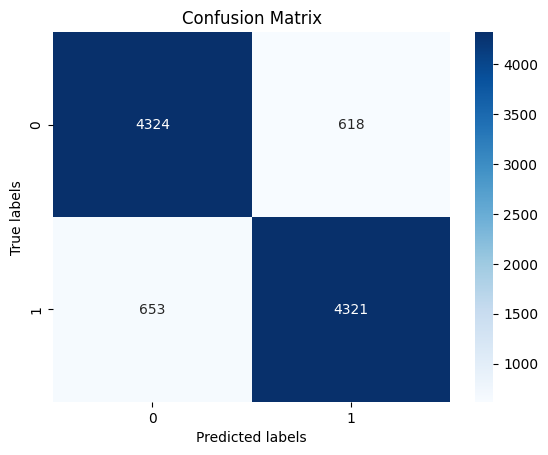

In [38]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Example true labels and predicted labels
true_labels = test_df_naive.label
predicted_labels = test_df_naive.label_pred

# Create confusion matrix
conf_matrix = np.zeros((2, 2))
for true_label, predicted_label in zip(true_labels, predicted_labels):
    conf_matrix[true_label, predicted_label] += 1

# Plot confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()
